<a href="https://colab.research.google.com/github/JuanZapa7a/Medical-Image-Processing/blob/main/NB4-14%20Detecting%20Red%20Blood%20Cells%20(RBC)%2C%20White%20Blood%20Cells%20(WBC)%2C%20and%20Platelets%20from%20Microscope%20Images%20Using%20YOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Detecting Red Blood Cells (RBC), White Blood Cells (WBC) and Platelets from Microscope Images

## 1. Introduction

**`Red Blood Cells (RBCs), White Blood Cells (WBCs), and Platelets`** are critical components of blood, each with specific roles in maintaining health and diagnosing various diseases:

1. **`Red Blood Cells (RBCs)`**:
   - **`Function`**: RBCs, also known as `erythrocyte`, are responsible `for carrying oxygen from the lungs to the rest of the body and returning carbon dioxide back to the lungs for exhalation`. They contain `hemoglobin`, a protein that binds oxygen.
   - **`Associated Diseases`**:
     - **`Anemia`**: A condition characterized by a `deficiency of RBCs or hemoglobin`, leading to fatigue, weakness, and shortness of breath.
     - **`Polycythemia`**: An `abnormal increase in RBCs`, which can cause blood clots, leading to heart attacks or strokes.

   **[Mayo Clinic - Red Blood Cells](https://www.mayoclinic.org/tests-procedures/complete-blood-count/about/pac-20384919)**

2. **`White Blood Cells (WBCs)`**:
   - **`Function`**: WBCs, or `leukocytes`, are part of the immune system and are crucial for `fighting infections, attacking foreign bodies`, and protecting against disease.
   - **`Associated Diseases`**:
     - **`Leukopenia`**: A `decrease in WBC count`, which `weakens the immune system and increases susceptibility to infections`.
     - **`Leukemia`**: A type of `cancer` where there is an `abnormal increase in WBCs`, leading to the disruption of normal blood cell production.

   **[NIH - White Blood Cells](https://www.ncbi.nlm.nih.gov/books/NBK2263/)**

3. **`Platelets`**:
   - **`Function`**: Platelets, or `thrombocytes`, are involved in `blood clotting`. They gather at the site of a blood vessel injury, stick to the lining of the injured vessel, and form a platform for blood coagulation.
   - **`Associated Diseases`**`
     - **`Thrombocytopenia`**: A condition characterized by a `low platelet count, leading to excessive bleeding and bruising`.
     - **`Thrombocythemia`**: An abnormally `high platelet count, which can cause blood clots, increasing the risk of stroke or heart attack`.

   **[Johns Hopkins - Platelets](https://www.hopkinsmedicine.org/health/conditions-and-diseases/thrombocytopenia-low-platelet-count)**



### **Blood Cells Detection and Diagnosis**:

`By analyzing the levels and morphology of RBCs, WBCs, and platelets, medical professionals can diagnose a wide range of conditions`, from infections and immune disorders to blood cancers and clotting disorders. `Automated detection using deep learning improves the accuracy and efficiency of these diagnostics, helping to identify these conditions early and accurately`.


The detection of red blood cells (RBCs), white blood cells (WBCs), and platelets using **`deep learning`** is crucial in biomedical diagnostics for several key reasons:

1. **`Accuracy in Diagnosis`**: Manual analysis of blood cells can be error-prone due to observer fatigue or subjectivity. `Deep learning algorithms, trained on large datasets, can identify and classify cells with high accuracy, reducing the risk of incorrect diagnoses`.

2. **`Speed of Results`**: The automated processing of images and detection of cells using `deep learning is significantly faster than traditional methods`. This allows for quicker results, which is critical in medical emergencies.

3. **`Early Disease Detection`**: `Deep learning can detect subtle abnormalities` in blood cells that may indicate diseases such as leukemia, anemia, and other hematological disorders at early stages, enabling timely treatment.

4. **`Cost Reduction`**: Automation of blood analysis through `deep learning reduces the need for human intervention`, potentially lowering the costs associated with laboratory tests and allowing more patients to access high-quality diagnostic services.

5. **`Scalability and Accessibility`**:`Deep learning-based systems can be deployed in multiple locations and are scalable`, enabling laboratories in remote or resource-limited areas to perform blood analysis with the same accuracy as advanced healthcare centers.

**References:**

- A study published in *`Nature`* highlights the use of deep learning for blood cell detection, emphasizing its accuracy and efficiency compared to traditional methods ([Nature](https://www.nature.com/articles/s41598-020-71180-0)).

- The *`American Society of Hematology`* discusses how artificial intelligence, particularly deep learning, is transforming the diagnosis of hematological diseases through image analysis ([ASH](https://www.hematology.org/education/trainees/fellows/career-planning/ai-in-hematology)).

- An article from *`IEEE`* explores how deep learning models are being trained to identify RBCs, WBCs, and platelets with accuracy comparable to human experts, improving the diagnosis of blood-related diseases ([IEEE](https://ieeexplore.ieee.org/document/9139050)).

## 2. **Setting up our workspace**

---
**Display Basic GPU Information**

---

In [ ]:
!nvidia-smi

Wed Sep 25 09:29:04 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

---
**Set`/content` as HOME  and `/content/datasets` as dataset_dir**

---

In [ ]:
import os
HOME = os.getcwd()
print(HOME)


/content


---
**Mount google drive** (if you want save something in it)

---

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


---
**Install roboflow and ultralytics libraries** (1m 11s)

---

In [ ]:
%%time

# Pip install method (recommended)

!pip install --upgrade pip
!pip install -q torch torchvision torchaudio
!pip install -q roboflow
!pip install -q ultralytics #==8.0.196

  Using cached pip-24.2-py3-none-any.whl.metadata (3.6 kB)
Using cached pip-24.2-py3-none-any.whl (1.8 MB)
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 874.1/874.1 kB 37.9 MB/s eta 0:00:00
CPU times: user 64.6 ms, sys: 12.9 ms, total: 77.5 ms
Wall time: 14.7 s


---
**Check ultralytics installation**

---

In [ ]:
# check package y hardware
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.100 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 36.5/112.6 GB disk)


---
**Load YOLO models library**

---

In [ ]:
from ultralytics import YOLO

---
**Create dataset directory**

---

Create the [dataset](https://docs.ultralytics.com/datasets/detect/) directory (if it doesn't exist), where we are going to save the dataset with which we are going to train YOLOv8.

In [ ]:
import os
datasets_dir = os.path.join(HOME, "datasets")
os.makedirs(datasets_dir, exist_ok=True)
print(os.getcwd())

/content


## 3. **Download Dataset**

---
**Download yolo-yejbs dataset**

---

Our dataset is from Universe Roboflow [yolo-yejbs](https://universe.roboflow.com/tfg-2nmge/yolo-yejbs/dataset/1#)

In [ ]:
# Change diretory to datasets_dir
os.chdir(datasets_dir)
print('datasets_dir =', os.getcwd())


# Dataset import (snipet from roboflow)
from roboflow import Roboflow
rf = Roboflow(api_key="5xvhWbT7GJjHZvn6ukFk")
project = rf.workspace("tfg-2nmge").project("yolo-yejbs")
version = project.version(1)
dataset = version.download("yolov8")


datasets_dir = /content/datasets
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.100, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to YOLO-1 in yolov8:: 100%|██████████| 3982/3982 [00:01<00:00, 3545.32it/s]


---
**Change to HOME**

---

In [ ]:
# Change to HOME directory
os.chdir(HOME)
print('dir =', os.getcwd())

dir = /content


---
**List dataset directory**

---

In [ ]:
# Install pip Tree globally

!sudo apt install tree -q

!tree --dirsfirst -L 2  "datasets/YOLO-1"

Reading package lists...
Building dependency tree...
Reading state information...
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 1s (68.7 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package tree.
(Reading database ... 123605 files and directories currently installed.)
Preparing

---
**Change valid for val**

---

In [ ]:
%cd datasets/YOLO-1
!mv valid val
%cd /content
print(os.getcwd())

!tree --dirsfirst -L 2  "datasets/YOLO-1"

/content/datasets/YOLO-1
/content
/content
datasets/YOLO-1
├── test
│   ├── images
│   └── labels
├── train
│   ├── images
│   └── labels
├── val
│   ├── images
│   └── labels
├── data.yaml
├── README.dataset.txt
└── README.roboflow.txt

9 directories, 3 files


---
**read data.yaml**

---


In [ ]:
import yaml

# Cargar el archivo YAML desde la ubicación especificada
with open(f'{dataset.location}/data.yaml', 'r') as file:
    data = yaml.safe_load(file)

# Imprimir el contenido del archivo YAML
data


{'names': ['Platelets', 'RBC', 'WBC'],
 'nc': 3,
 'roboflow': {'license': 'CC BY 4.0',
  'project': 'yolo-yejbs',
  'url': 'https://universe.roboflow.com/tfg-2nmge/yolo-yejbs/dataset/1',
  'version': 1,
  'workspace': 'tfg-2nmge'},
 'test': '../test/images',
 'train': 'YOLO-1/train/images',
 'val': 'YOLO-1/valid/images'}

---
**Variable `dataset.location` stores the address**

---

In [ ]:
# IMPORTANT: the variable dataset.location stores the address where
# the Roboflow dataset has been saved.
print(dataset.location)

/content/datasets/YOLO-1


---
**Display some images from dataset**

---


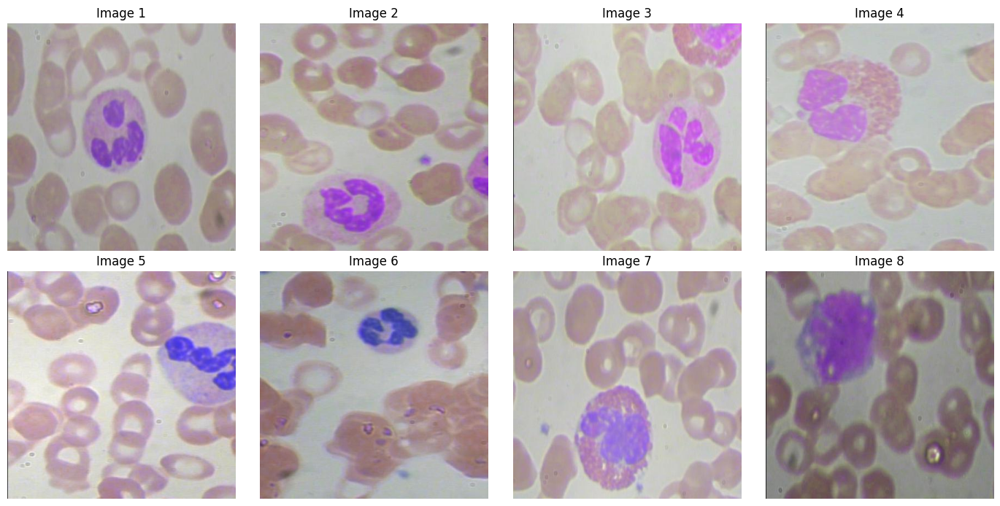

In [ ]:
import matplotlib.pyplot as plt
import glob
import matplotlib.image as mpimg

# Directory of the images
image_directory = f'{dataset.location}/test/images/'

# List of image paths
image_paths = glob.glob(image_directory + '*.jpg')[:8]

# Set up the figure with subplots
fig, axs = plt.subplots(2, 4, figsize=(14, 7))

# Iterate through the images and display them in the subplots
for i, image_path in enumerate(image_paths):
    row = i // 4
    col = i % 4
    img = mpimg.imread(image_path)
    axs[row, col].imshow(img)
    axs[row, col].set_title(f'Image {i + 1}')
    axs[row, col].axis('off')

# Adjust the layout of the subplots
plt.tight_layout()
plt.show()

---
**Visualize annotations**

___

To visualize a random TXT file located in the `yolo-1/test/labels`

In [ ]:
import os
import random

# Path to the directory containing the TXT files
directory = f'{dataset.location}/test/labels'

# List all files in the directory
files = os.listdir(directory)

# Filter only the .txt files
txt_files = [file for file in files if file.endswith('.txt')]

# Check if there are any .txt files in the directory
if not txt_files:
    print("There are no TXT files in the directory.")
else:
    # Select a random file
    random_file = random.choice(txt_files)
    file_path = os.path.join(directory, random_file)

    # Read and display the content of the selected file
    with open(file_path, 'r') as file:
        content = file.read()
        print(f"Content of the file {random_file}:")
        print(content)


Content of the file BloodImage_00023_jpg.rf.e2e65d09da282ea8d769c2e60b853c74.txt:
2 0.24639423076923078 0.7055288461538461 0.38461538461538464 0.3076923076923077
1 0.36538461538461536 0.46634615384615385 0.2692307692307692 0.18509615384615385
1 0.2956730769230769 0.2800480769230769 0.2692307692307692 0.18509615384615385
1 0.6574519230769231 0.4182692307692308 0.2692307692307692 0.18509615384615385
1 0.7055288461538461 0.6237980769230769 0.2548076923076923 0.1778846153846154
1 0.8954326923076923 0.41947115384615385 0.20432692307692307 0.21634615384615385
1 0.4387019230769231 0.08413461538461539 0.2620192307692308 0.16346153846153846
1 0.9519230769230769 0.8245192307692307 0.09134615384615384 0.18990384615384615
1 0.07572115384615384 0.8737980769230769 0.15144230769230768 0.18028846153846154
1 0.4254807692307692 0.9014423076923077 0.21153846153846154 0.14903846153846154
1 0.0733173076923077 0.109375 0.14423076923076922 0.16826923076923078
1 0.6610576923076923 0.03245192307692308 0.182692

## 4. **Training with ULTRALYTICS YOLOv8**

Modify data.yaml to remove 'YOLO-1' from the train and
valid paths.

In [ ]:
# New Data
data = {
    'names': ['Platelets', 'RBC', 'WBC'],
    'nc': 3,
    'roboflow': {
        'license': 'CC BY 4.0',
        'project': 'yolo-yejbs',
        'url': 'https://universe.roboflow.com/tfg-2nmge/yolo-yejbs/dataset/1',
        'version': 1,
        'workspace': 'tfg-2nmge'
    },
    'test': '../test/images',
    'train': 'train/images',
    'val': 'val/images'
}

# Print data
print(data)

# Save the updated dictionary in the YAML file.
with open(f'{dataset.location}/data.yaml', 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

print(f"Data has been saved to {dataset.location}")


{'names': ['Platelets', 'RBC', 'WBC'], 'nc': 3, 'roboflow': {'license': 'CC BY 4.0', 'project': 'yolo-yejbs', 'url': 'https://universe.roboflow.com/tfg-2nmge/yolo-yejbs/dataset/1', 'version': 1, 'workspace': 'tfg-2nmge'}, 'test': '../test/images', 'train': 'train/images', 'val': 'val/images'}
Data has been saved to /content/datasets/YOLO-1


---
**Training the dataset**

---

In [ ]:
# Go to HOME
os.chdir(HOME)
print(os.getcwd())

# Start training. If ".pt" does not exist in the current directory, it will be downloaded.
model = YOLO("yolov8n.pt")  # load a pretrained model (recommended for training)

# Train the model
detection_train = model.train(data=f'{dataset.location}/data.yaml', epochs=100, imgsz=640, save=True)

/content


100%|██████████| 6.25M/6.25M [00:00<00:00, 272MB/s]

Ultralytics YOLOv8.2.100 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/YOLO-1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=T

100%|██████████| 755k/755k [00:00<00:00, 99.0MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/datasets/YOLO-1/train/labels... 1723 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1723/1723 [00:01<00:00, 1713.98it/s]


train: New cache created: /content/datasets/YOLO-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.16 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/datasets/YOLO-1/val/labels... 175 images, 0 backgrounds, 0 corrupt: 100%|██████████| 175/175 [00:00<00:00, 1223.42it/s]

val: New cache created: /content/datasets/YOLO-1/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.77G      1.354       1.89      1.463        225        640: 100%|██████████| 108/108 [00:39<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.99it/s]

                   all        175       2301       0.73      0.778      0.828      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.73G      1.219      1.107      1.332        262        640: 100%|██████████| 108/108 [00:34<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.82it/s]

                   all        175       2301      0.773       0.87      0.858      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.57G      1.201      1.014       1.29        276        640: 100%|██████████| 108/108 [00:34<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.59it/s]

                   all        175       2301      0.727      0.795      0.852      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.63G      1.173     0.9537      1.263        208        640: 100%|██████████| 108/108 [00:35<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.56it/s]

                   all        175       2301       0.81      0.903      0.898      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.49G      1.182     0.9361      1.258        263        640: 100%|██████████| 108/108 [00:34<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.64it/s]

                   all        175       2301      0.808       0.89      0.882      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.34G       1.15      0.894      1.235        213        640: 100%|██████████| 108/108 [00:34<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.60it/s]

                   all        175       2301      0.828       0.89      0.901      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.47G      1.159     0.8888       1.24        277        640: 100%|██████████| 108/108 [00:34<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.80it/s]

                   all        175       2301      0.818      0.912      0.908       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.65G      1.142     0.8589      1.226        213        640: 100%|██████████| 108/108 [00:34<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.60it/s]

                   all        175       2301      0.828      0.896      0.908       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.83G      1.135      0.849      1.227        178        640: 100%|██████████| 108/108 [00:34<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.63it/s]

                   all        175       2301      0.828       0.91      0.911      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100       2.4G      1.121     0.8305      1.214        240        640: 100%|██████████| 108/108 [00:34<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.99it/s]

                   all        175       2301      0.834      0.914      0.905      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.82G      1.133     0.8315      1.223        244        640: 100%|██████████| 108/108 [00:33<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.39it/s]

                   all        175       2301      0.844      0.858      0.905      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.96G       1.11     0.8101      1.204        252        640: 100%|██████████| 108/108 [00:33<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.93it/s]

                   all        175       2301      0.838      0.888      0.904      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       2.8G      1.115      0.806      1.215        240        640: 100%|██████████| 108/108 [00:32<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.38it/s]


                   all        175       2301      0.844      0.917      0.912      0.607

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.98G      1.112     0.8021      1.212        180        640: 100%|██████████| 108/108 [00:33<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.84it/s]

                   all        175       2301      0.836       0.91      0.918      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.84G      1.098     0.7893        1.2        287        640: 100%|██████████| 108/108 [00:33<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.47it/s]

                   all        175       2301      0.846      0.909      0.925       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.96G      1.086     0.7875      1.195        171        640: 100%|██████████| 108/108 [00:33<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.73it/s]

                   all        175       2301      0.861      0.906      0.918      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.83G      1.089     0.7804      1.192        272        640: 100%|██████████| 108/108 [00:34<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.85it/s]

                   all        175       2301      0.824      0.901       0.91      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.09G      1.087     0.7757      1.198        167        640: 100%|██████████| 108/108 [00:33<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.55it/s]

                   all        175       2301      0.845      0.909      0.926      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.95G      1.081     0.7708      1.194        236        640: 100%|██████████| 108/108 [00:32<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.63it/s]

                   all        175       2301      0.865      0.885      0.929      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.78G      1.083     0.7584      1.197        217        640: 100%|██████████| 108/108 [00:32<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.02it/s]

                   all        175       2301      0.856      0.891      0.921      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.68G      1.079     0.7674      1.187        228        640: 100%|██████████| 108/108 [00:33<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.25it/s]

                   all        175       2301       0.85       0.92      0.929      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.74G      1.069     0.7513      1.186        265        640: 100%|██████████| 108/108 [00:32<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.97it/s]

                   all        175       2301       0.84      0.926      0.918      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.52G       1.06     0.7365      1.185        243        640: 100%|██████████| 108/108 [00:32<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.93it/s]

                   all        175       2301      0.839      0.912       0.92      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.73G      1.071     0.7379       1.19        189        640: 100%|██████████| 108/108 [00:33<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.68it/s]

                   all        175       2301      0.832       0.91      0.923      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100       2.9G      1.056     0.7283      1.178        242        640: 100%|██████████| 108/108 [00:34<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.64it/s]

                   all        175       2301      0.853      0.914      0.924      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.55G      1.059     0.7394      1.179        166        640: 100%|██████████| 108/108 [00:32<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.98it/s]

                   all        175       2301      0.847      0.904      0.934      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.76G      1.054     0.7288       1.18        209        640: 100%|██████████| 108/108 [00:32<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.70it/s]

                   all        175       2301      0.856      0.903      0.929      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.43G      1.049     0.7199      1.168        221        640: 100%|██████████| 108/108 [00:33<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.52it/s]

                   all        175       2301      0.857      0.908      0.923      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.31G      1.046     0.7146      1.162        303        640: 100%|██████████| 108/108 [00:32<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.36it/s]

                   all        175       2301      0.846      0.927      0.931       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.82G       1.04      0.716      1.167        248        640: 100%|██████████| 108/108 [00:33<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.57it/s]


                   all        175       2301      0.867      0.885      0.932      0.643

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.13G      1.039     0.7036      1.166        199        640: 100%|██████████| 108/108 [00:33<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.75it/s]

                   all        175       2301      0.852       0.91      0.924      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.99G      1.038     0.7011      1.166        278        640: 100%|██████████| 108/108 [00:34<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.71it/s]

                   all        175       2301      0.878       0.89       0.93      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.45G      1.024     0.6958      1.155        224        640: 100%|██████████| 108/108 [00:32<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.24it/s]

                   all        175       2301      0.878      0.878      0.935      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.82G      1.017      0.688      1.155        183        640: 100%|██████████| 108/108 [00:33<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.17it/s]

                   all        175       2301      0.847      0.899      0.923       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.58G      1.019     0.6882      1.155        278        640: 100%|██████████| 108/108 [00:32<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.10it/s]

                   all        175       2301       0.86       0.92      0.943      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.56G      1.018     0.6876      1.159        204        640: 100%|██████████| 108/108 [00:32<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.16it/s]

                   all        175       2301      0.846      0.898      0.916      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.76G      1.012     0.6696      1.148        253        640: 100%|██████████| 108/108 [00:32<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.94it/s]

                   all        175       2301      0.865      0.877      0.923       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.62G      1.024     0.6761      1.158        228        640: 100%|██████████| 108/108 [00:32<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.10it/s]

                   all        175       2301      0.862      0.918      0.934      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.47G      1.003     0.6687      1.147        289        640: 100%|██████████| 108/108 [00:31<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.09it/s]

                   all        175       2301      0.861      0.909      0.932      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.92G      1.003     0.6716      1.142        249        640: 100%|██████████| 108/108 [00:31<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]

                   all        175       2301      0.861      0.899      0.931      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.14G          1     0.6651       1.14        248        640: 100%|██████████| 108/108 [00:32<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.98it/s]

                   all        175       2301      0.843      0.909      0.927      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.73G     0.9889     0.6609      1.134        216        640: 100%|██████████| 108/108 [00:32<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.14it/s]

                   all        175       2301      0.862       0.91      0.928      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.71G     0.9944     0.6548      1.139        164        640: 100%|██████████| 108/108 [00:32<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.31it/s]

                   all        175       2301      0.839      0.914      0.922      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.06G     0.9927     0.6541      1.135        229        640: 100%|██████████| 108/108 [00:32<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.26it/s]

                   all        175       2301      0.861      0.893      0.921      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.89G     0.9874     0.6596      1.138        202        640: 100%|██████████| 108/108 [00:32<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.22it/s]

                   all        175       2301      0.872      0.895      0.932      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.99G     0.9785     0.6535      1.139        176        640: 100%|██████████| 108/108 [00:32<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.95it/s]

                   all        175       2301      0.848      0.922      0.938      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.84G     0.9789     0.6439      1.132        231        640: 100%|██████████| 108/108 [00:32<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.19it/s]

                   all        175       2301       0.85      0.922       0.93      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.51G      0.979     0.6381      1.136        191        640: 100%|██████████| 108/108 [00:31<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]

                   all        175       2301      0.876      0.912      0.941      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.69G     0.9747     0.6395      1.129        225        640: 100%|██████████| 108/108 [00:31<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.15it/s]

                   all        175       2301      0.861      0.923      0.937      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         3G     0.9664     0.6308      1.119        242        640: 100%|██████████| 108/108 [00:30<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.09it/s]

                   all        175       2301       0.88      0.904      0.942      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.82G     0.9615     0.6265      1.123        227        640: 100%|██████████| 108/108 [00:32<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.17it/s]

                   all        175       2301      0.877      0.915      0.943       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.88G     0.9608     0.6252      1.126        253        640: 100%|██████████| 108/108 [00:31<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.20it/s]

                   all        175       2301      0.863      0.906      0.935       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.56G      0.958     0.6217      1.119        218        640: 100%|██████████| 108/108 [00:32<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.28it/s]

                   all        175       2301      0.846      0.949      0.937      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.99G     0.9446     0.6162      1.113        228        640: 100%|██████████| 108/108 [00:32<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.20it/s]

                   all        175       2301      0.866       0.92      0.936      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.19G     0.9521     0.6189      1.117        286        640: 100%|██████████| 108/108 [00:32<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.51it/s]

                   all        175       2301      0.886      0.905      0.943      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.44G     0.9449     0.6147      1.116        215        640: 100%|██████████| 108/108 [00:32<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.58it/s]

                   all        175       2301      0.859      0.924      0.941      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.54G     0.9322      0.604      1.101        147        640: 100%|██████████| 108/108 [00:32<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

                   all        175       2301       0.85      0.909      0.933      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.74G     0.9284     0.5973      1.097        257        640: 100%|██████████| 108/108 [00:32<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.71it/s]

                   all        175       2301      0.867      0.926      0.942      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.92G     0.9399     0.5992      1.103        197        640: 100%|██████████| 108/108 [00:32<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.53it/s]

                   all        175       2301       0.89      0.889      0.935      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.31G     0.9362     0.6038        1.1        206        640: 100%|██████████| 108/108 [00:32<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.81it/s]


                   all        175       2301       0.86      0.915      0.939      0.668

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.55G      0.922     0.5905      1.098        178        640: 100%|██████████| 108/108 [00:32<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.84it/s]

                   all        175       2301      0.857      0.908      0.934      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.79G     0.9227     0.5885      1.105        185        640: 100%|██████████| 108/108 [00:33<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.88it/s]

                   all        175       2301      0.861      0.933      0.944      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.09G     0.9252     0.5911      1.105        222        640: 100%|██████████| 108/108 [00:32<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.15it/s]

                   all        175       2301      0.873      0.919       0.94      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.77G     0.9112     0.5807      1.093        215        640: 100%|██████████| 108/108 [00:32<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

                   all        175       2301      0.889      0.925      0.947      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      3.09G     0.9087     0.5738      1.095        240        640: 100%|██████████| 108/108 [00:33<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.93it/s]


                   all        175       2301      0.863      0.928      0.941      0.677

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.76G     0.9122     0.5834      1.098        239        640: 100%|██████████| 108/108 [00:33<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.75it/s]

                   all        175       2301      0.873      0.925      0.946      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.06G     0.9064     0.5759      1.094        203        640: 100%|██████████| 108/108 [00:33<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.81it/s]

                   all        175       2301      0.882      0.921      0.945       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.56G     0.9017     0.5739      1.091        261        640: 100%|██████████| 108/108 [00:33<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.36it/s]

                   all        175       2301      0.882      0.919      0.944      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.52G     0.8994     0.5688      1.087        272        640: 100%|██████████| 108/108 [00:34<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.63it/s]

                   all        175       2301      0.884       0.92      0.941      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.63G     0.8966     0.5695      1.096        192        640: 100%|██████████| 108/108 [00:32<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.61it/s]

                   all        175       2301      0.894       0.91      0.946      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100       2.5G     0.9004     0.5699      1.089        244        640: 100%|██████████| 108/108 [00:34<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.63it/s]

                   all        175       2301      0.871      0.935      0.944      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.58G     0.8951     0.5707      1.086        230        640: 100%|██████████| 108/108 [00:33<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.86it/s]

                   all        175       2301      0.886      0.923      0.945      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.66G     0.8876      0.556      1.082        285        640: 100%|██████████| 108/108 [00:33<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.00it/s]

                   all        175       2301      0.871      0.931      0.945      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.92G     0.8856     0.5555      1.081        244        640: 100%|██████████| 108/108 [00:33<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.82it/s]

                   all        175       2301      0.888      0.929      0.947      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.76G     0.8804     0.5514      1.074        270        640: 100%|██████████| 108/108 [00:33<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.83it/s]

                   all        175       2301       0.87      0.932      0.945      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.74G     0.8774     0.5508       1.08        188        640: 100%|██████████| 108/108 [00:33<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.82it/s]

                   all        175       2301      0.884      0.926      0.948      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100       2.8G     0.8738     0.5476      1.076        255        640: 100%|██████████| 108/108 [00:33<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.96it/s]

                   all        175       2301      0.876      0.924      0.947      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.03G     0.8683      0.543      1.075        180        640: 100%|██████████| 108/108 [00:33<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.94it/s]

                   all        175       2301      0.876      0.931      0.946      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100       2.7G     0.8666     0.5443      1.069        278        640: 100%|██████████| 108/108 [00:33<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.82it/s]

                   all        175       2301      0.875       0.94      0.949      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.37G     0.8682     0.5396      1.071        241        640: 100%|██████████| 108/108 [00:32<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.90it/s]

                   all        175       2301        0.9      0.911      0.948       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.78G      0.864     0.5359       1.07        238        640: 100%|██████████| 108/108 [00:33<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.06it/s]

                   all        175       2301      0.896      0.923      0.946      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.34G     0.8624     0.5409      1.075        199        640: 100%|██████████| 108/108 [00:33<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.25it/s]

                   all        175       2301      0.892      0.924       0.95       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.79G      0.855      0.534      1.066        213        640: 100%|██████████| 108/108 [00:33<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.39it/s]

                   all        175       2301      0.887      0.922      0.944      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.91G     0.8505     0.5252      1.058        281        640: 100%|██████████| 108/108 [00:34<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.82it/s]

                   all        175       2301      0.902      0.911      0.951      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.94G     0.8497     0.5316      1.064        266        640: 100%|██████████| 108/108 [00:33<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.48it/s]

                   all        175       2301      0.899      0.916      0.948       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.81G     0.8465     0.5234      1.059        246        640: 100%|██████████| 108/108 [00:32<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.99it/s]

                   all        175       2301      0.901      0.912      0.951      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.92G     0.8438     0.5208      1.056        180        640: 100%|██████████| 108/108 [00:32<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.70it/s]

                   all        175       2301       0.88      0.925      0.945       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.67G     0.8438     0.5193      1.058        247        640: 100%|██████████| 108/108 [00:32<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.35it/s]

                   all        175       2301      0.898      0.924      0.947      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.44G     0.8432     0.5184      1.058        279        640: 100%|██████████| 108/108 [00:32<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.47it/s]

                   all        175       2301      0.897      0.918      0.946      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.84G     0.8392     0.5184      1.056        216        640: 100%|██████████| 108/108 [00:32<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.25it/s]


                   all        175       2301       0.89      0.932      0.951      0.699
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.24G     0.8138     0.4727      1.062        176        640: 100%|██████████| 108/108 [00:32<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.20it/s]

                   all        175       2301      0.881      0.937      0.951      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100       2.2G     0.7944     0.4565      1.049        146        640: 100%|██████████| 108/108 [00:30<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.03it/s]

                   all        175       2301      0.886      0.942      0.952      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.16G     0.7862     0.4462      1.047        124        640: 100%|██████████| 108/108 [00:31<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.66it/s]

                   all        175       2301      0.902      0.927      0.952        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100       2.2G     0.7823     0.4427      1.044        161        640: 100%|██████████| 108/108 [00:33<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.67it/s]

                   all        175       2301      0.879      0.946      0.952      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.19G     0.7775     0.4388      1.044        117        640: 100%|██████████| 108/108 [00:33<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.99it/s]

                   all        175       2301        0.9      0.924      0.952      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.24G     0.7792     0.4429      1.046        143        640: 100%|██████████| 108/108 [00:32<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.75it/s]

                   all        175       2301      0.888      0.932      0.952      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.19G     0.7686     0.4355      1.037        121        640: 100%|██████████| 108/108 [00:32<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.27it/s]

                   all        175       2301      0.897      0.929      0.954      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100       2.2G     0.7642     0.4351      1.038        130        640: 100%|██████████| 108/108 [00:30<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.46it/s]

                   all        175       2301      0.898       0.93      0.954      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.16G     0.7614     0.4265      1.035        137        640: 100%|██████████| 108/108 [00:30<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.08it/s]

                   all        175       2301       0.89      0.947      0.954      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.21G     0.7629      0.431      1.036        139        640: 100%|██████████| 108/108 [00:29<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.23it/s]

                   all        175       2301      0.889      0.943      0.953      0.708



100 epochs completed in 1.003 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.100 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.02it/s]


                   all        175       2301      0.888      0.943      0.953      0.708
             Platelets         94        173      0.858       0.96      0.958      0.544
                   RBC        164       1947      0.825       0.87      0.906      0.696
                   WBC        174        181      0.982          1      0.995      0.883
Speed: 0.3ms preprocess, 3.1ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to runs/detect/train


---
**Results Output Console**

---

This `console output is a detailed log of the training process and may change due to the effect of various test runs`. This output indicates that the training has started successfully, with various configurations and optimizations applied to ensure efficient and effective model training.

1. **`System and Environment Details`**:
   - **YOLOv8.2.77**: Indicates the version of the YOLOv8 model being used.
   - **Python-3.10.12, torch-2.3.1+cu121**: Specifies the Python version and PyTorch version with CUDA 12.1 (for GPU acceleration).
   - **CUDA:0 (Tesla T4, 15102MiB)**: The model is using GPU 0, which is a Tesla T4 with 15,102 MiB of memory.

2. **`Training Configuration`**:
   - **task=detect**: The task is object detection.
   - **model=yolov8n.pt**: Using the YOLOv8 "nano" pre-trained model.
   - **data=/content/datasets/YOLO-1/data.yaml**: The dataset configuration is specified in `data.yaml`.
   - **epochs=100**: The model will train for 100 epochs.
   - **batch=16, imgsz=640**: Each batch has 16 images of size 640x640 pixels.

3. **`Model Architecture`**:
   - The model summary shows the architecture layers, parameters, and gradients involved in the model.
   - **Transferred 319/355 items from pretrained weights**: Indicates that weights from a pre-trained model were successfully transferred, which helps speed up training.

4. **`Training Details`**:
   - **AMP**: Automatic Mixed Precision is enabled, optimizing performance by using mixed precision during training.
   - **Scanning /content/datasets/YOLO-1/train/labels...**: The system is scanning the dataset for training and validation. It found 1,723 training images and 175 validation images, with no background or corrupted images.
   - **Augmentations**: The `albumentations` library is used for data augmentation, applying effects like blur, median blur, grayscale conversion, and CLAHE.

5. **`Optimizer`**:
   - **optimizer=auto**: YOLOv8 automatically determines the best optimizer, learning rate, and momentum. It selected the AdamW optimizer with a learning rate of 0.001429 and a momentum of 0.9.

6. **`Outputs and Logging`**:
   - **TensorBoard**: TensorBoard logging is enabled for monitoring the training process.
   - **Image sizes**: Both training and validation images are resized to 640x640.
   - **Using 2 dataloader workers**: Two workers are used to load data, which balances the speed of data loading and system performance.

7. **`Warnings`**:
   - **os.fork() was called...**: A warning about potential issues when using `os.fork()` in multithreaded code, which might lead to deadlocks.

`The output also indicates the performance and efficiency of the model during and after training`:

1. **`Epochs 62/100 and 63/100`:**
   - **GPU Memory:** Shows the GPU memory usage during training (e.g., 2.35G and 2.71G).
   - **box_loss, cls_loss, dfl_loss:** These values represent the losses for bounding box regression, classification, and distribution focal loss, respectively. Lower values generally indicate better performance.
   - **Instances and Size:** Number of instances (objects) in the batch and the size of the images (640x640 pixels).

2. **`Performance Metrics (Class: all)`:**
   - **Images:** 175 images were used for validation, with 2301 instances of objects detected.
   - **Box (P):** Precision of the bounding box predictions (0.918 in the final validation).
   - **R:** Recall, or the ability to detect all relevant objects (0.909 in the final validation).
   - **mAP50:** Mean Average Precision at IoU 0.5, which is a key metric for object detection accuracy (0.951).
   - **mAP50-95:** Mean Average Precision across different IoU thresholds from 0.5 to 0.95, indicating overall model accuracy (0.705).

3. **`Class-Specific Metrics`:**
   - **Platelets, RBC, WBC:** These are the specific classes of objects detected. Each class has its own Precision, Recall, mAP50, and mAP50-95 scores.
     - For example, WBC (White Blood Cells) has high scores: Precision (0.989), Recall (0.999), mAP50 (0.995), and mAP50-95 (0.878).

4. **`Efficiency`:**
   - **Speed:** The time taken per image for preprocessing (0.4ms), inference (4.7ms), and postprocessing (4.9ms). Lower times indicate faster model performance.

In summary, the model performed well with high precision, recall, and mAP scores, especially for the WBC class. The speed metrics suggest efficient processing. The final metrics indicate that the model is likely well-trained and ready for deployment or further fine-tuning.

---
**Results directory**

---

Classification_train.save_dir` is where the classification results are saved.


In [ ]:
print(detection_train.save_dir)

runs/detect/train


---
**Display training results**

---

In [ ]:
detection_train_save_dir= detection_train.save_dir

# Using os
import os
# Filtra solo imágenes jpg
files = [f for f in os.listdir(detection_train_save_dir)]
print("\nUsing os:")
for file in files:
    print(file)


#!ls -la {detection_train_save_dir}

# Using pathlib
from pathlib import Path
directory = Path(detection_train_save_dir)
files = list(directory.iterdir())
print("\nUsing pathlib:")
for item in files:
    print(item.name)


Using os:
confusion_matrix.png
R_curve.png
val_batch1_labels.jpg
val_batch0_pred.jpg
weights
val_batch0_labels.jpg
args.yaml
train_batch2.jpg
val_batch2_pred.jpg
labels.jpg
PR_curve.png
labels_correlogram.jpg
train_batch9721.jpg
val_batch2_labels.jpg
results.csv
train_batch9720.jpg
events.out.tfevents.1727256621.6acaca2792fd.370.0
results.png
val_batch1_pred.jpg
train_batch0.jpg
train_batch9722.jpg
confusion_matrix_normalized.png
P_curve.png
train_batch1.jpg
F1_curve.png

Using pathlib:
confusion_matrix.png
R_curve.png
val_batch1_labels.jpg
val_batch0_pred.jpg
weights
val_batch0_labels.jpg
args.yaml
train_batch2.jpg
val_batch2_pred.jpg
labels.jpg
PR_curve.png
labels_correlogram.jpg
train_batch9721.jpg
val_batch2_labels.jpg
results.csv
train_batch9720.jpg
events.out.tfevents.1727256621.6acaca2792fd.370.0
results.png
val_batch1_pred.jpg
train_batch0.jpg
train_batch9722.jpg
confusion_matrix_normalized.png
P_curve.png
train_batch1.jpg
F1_curve.png


---
**Print results.csv**

---

In [ ]:
#!cat {detection_train_save_dir}/results.csv | head -10

import pandas as pd
from pathlib import Path

# Directory path (assume detection_train_save_dir is already defined)
directory = Path(detection_train_save_dir)
csv_file = directory / 'results.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file)

# Print the DataFrame
print("Contents of results.csv:")
print(df)



Contents of results.csv:
                      epoch           train/box_loss           train/cls_loss  \
0                         1                  1.35390                  1.89010   
1                         2                  1.21890                  1.10680   
2                         3                  1.20110                  1.01400   
3                         4                  1.17310                  0.95367   
4                         5                  1.18220                  0.93613   
..                      ...                      ...                      ...   
95                       96                  0.77923                  0.44294   
96                       97                  0.76864                  0.43551   
97                       98                  0.76422                  0.43506   
98                       99                  0.76143                  0.42647   
99                      100                  0.76294                  0.43099   

  

---
**Print confusion matrix and confusion matrix normalized**

---

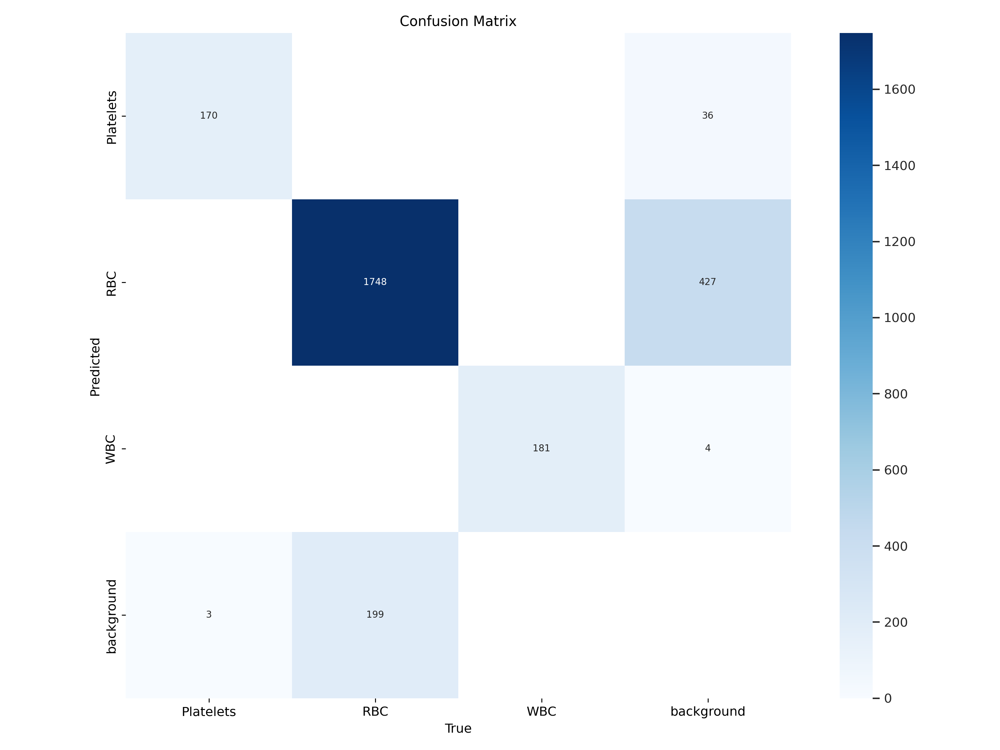

In [ ]:
from IPython.display import display, Image

Image(filename=f'{detection_train_save_dir}/confusion_matrix.png',width=800)

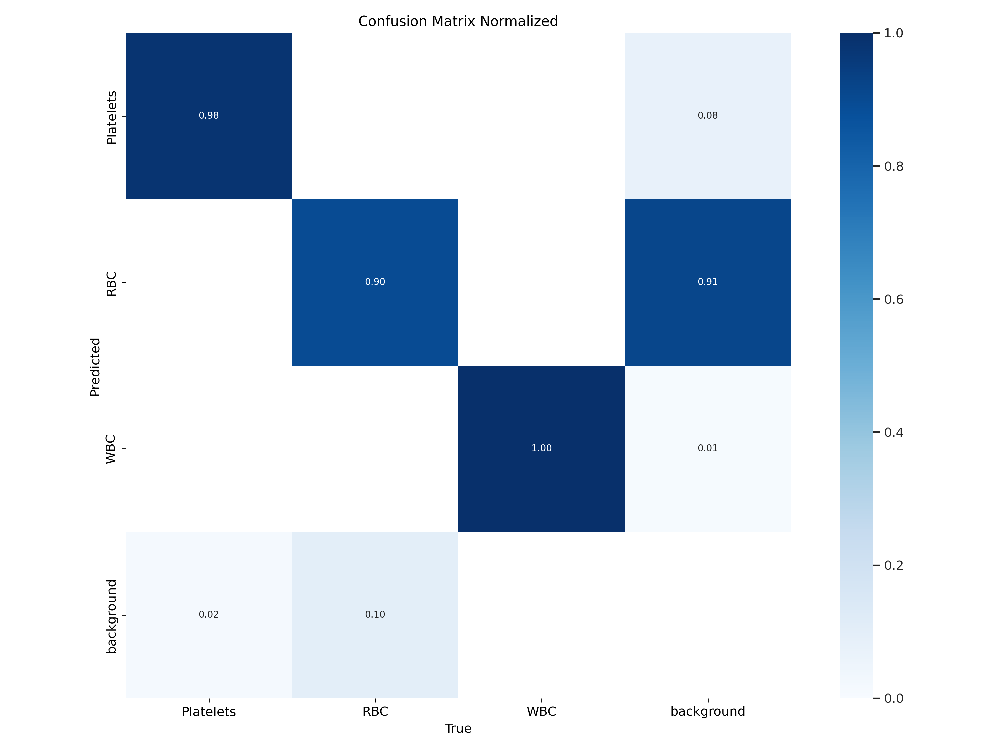

In [ ]:
Image(filename=f'{detection_train_save_dir}/confusion_matrix_normalized.png',width=800)

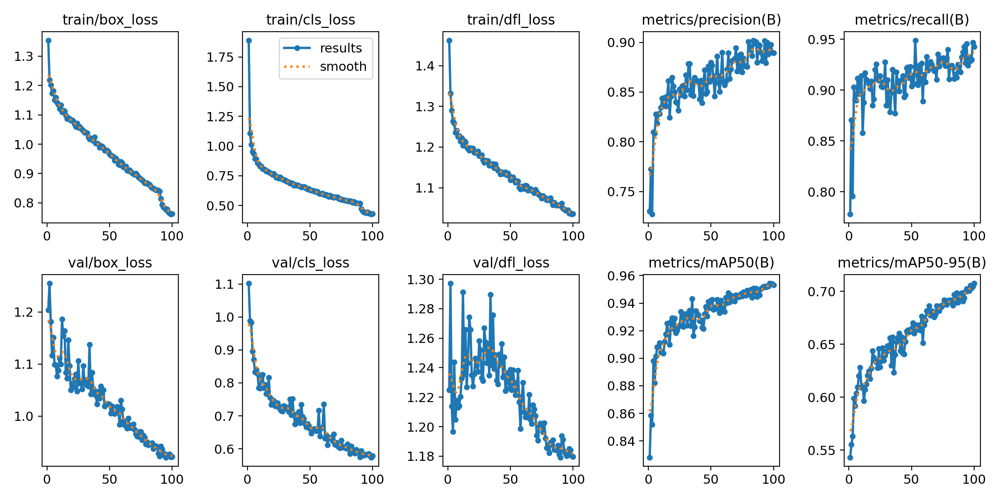

In [ ]:
Image(filename=f'{detection_train_save_dir}/results.png',width=800)

The image shows several plots that appear to represent the training and validation metrics of a machine learning model, likely related to object detection or a similar task. Here's an explanation of each plot:

### Top Row (Training Metrics)
1. **`train/box_loss`**:
   - This plot shows the box loss during training, which typically `measures the error in predicting the bounding boxes for objects`. The curve is steadily decreasing, indicating that the model is improving in predicting the bounding boxes as training progresses.

2. **`train/cls_loss`**:
   - This plot represents the classification loss during training, which `measures the error in predicting the correct class labels for the detected objects`. A decreasing trend indicates that the model is getting better at classifying objects correctly.

3. **`train/dfl_loss`**:
   - The DFL (Distribution Focal Loss) represents a loss function specific to the model's output distribution, such as the `probability distribution over anchor boxes`. A similar decreasing trend suggests improvement in this aspect of the model.

4. **`metrics/precision(B)`**:
   - Precision is the `ratio of true positive detections to the total number of positive predictions made by the model`. This curve shows an increasing trend, indicating that the model is becoming more precise in its predictions.

5. **`metrics/recall(B)`**:
   - Recall is the `ratio of true positive detections to the total number of actual positives in the dataset`. The upward trend suggests that the model is getting better at identifying all relevant objects, though the fluctuations might indicate variability in performance across different iterations.

### Bottom Row (Validation Metrics)
6. **`val/box_loss`**:
   - This plot shows the box loss on the validation set. The decrease here is `slower compared to the training box loss, which is typical as the model is being tested on unseen data`. The general downward trend is a positive sign.

7. **`val/cls_loss`**:
   - `Similar to the training classification loss but applied to the validation set`. The decreasing trend indicates that the model is generalizing well to new data.

8. **`val/dfl_loss`**:
   - This plot represents the validation DFL loss, and the `fluctuations suggest that the model might have varying performance across different batches or data points in the validation set`. However, the overall trend seems to be decreasing.

9. **`metrics/mAP50(B)`**:
   - Mean Average Precision at Intersection over Union (IoU) threshold 50 (mAP50) is a standard metric for evaluating object detection models. The increasing curve indicates that the model is improving in detecting objects with acceptable precision and recall. `mAP50(B) evaluates how well a model detects objects and places bounding boxes with at least 50% overlap with the ground truth boxes, specifically assessing the localization aspect of the model's performance`.

10. **`metrics/mAP50-95(B)`**:
    - This plot likely represents the mean Average Precision averaged over multiple IoU thresholds (typically from 50% to 95%). The upward trend shows that the model is improving in its overall detection performance across different thresholds.` The 50-95 in mAP50-95(B) refers to computing the mAP across multiple IoU thresholds, ranging from (less strict) 0.50 to (more strict) 0.95, in increments of 0.05.By averaging across all these thresholds, mAP50-95 provides a more balanced and detailed view of a model's localization performance. It ensures that the model is not just good at detecting objects loosely but also at making precise bounding box predictions`.

### General Observations
- **`Training vs. Validation Losses`**: The training losses are generally decreasing smoothly, which is expected. The validation losses are also decreasing but show more fluctuation, which is typical since the model is evaluated on unseen data.
  
- **`Precision and Recall`**: Both precision and recall are improving, but recall shows more variability. This could be due to the complexity of the validation data or the model’s sensitivity to different objects.

- **`mAP Metrics`**: The increasing trends in mAP50 and mAP50-95 suggest that the model is progressively getting better at detecting and classifying objects with higher accuracy.

These curves are generally indicative of a well-training model, with losses decreasing and evaluation metrics improving. The fluctuations in validation metrics, particularly recall and DFL loss, are normal but should be monitored to ensure they stabilize as training progresses.

---
**Display some examples** (train_batch1)

---

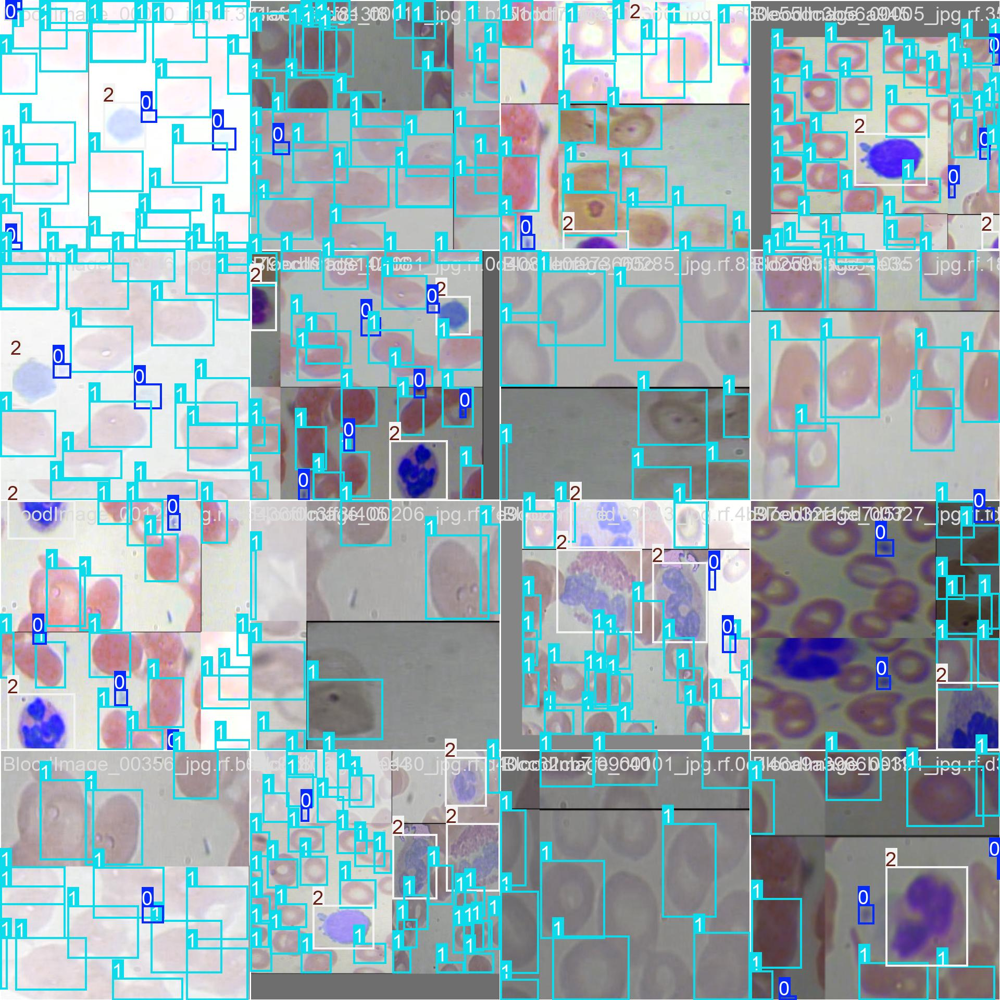

In [ ]:
Image(filename=f'{detection_train_save_dir}/train_batch1.jpg',width=800)

---
**Display some example (val_batch1 labels vs val_batch1 preds)**

---

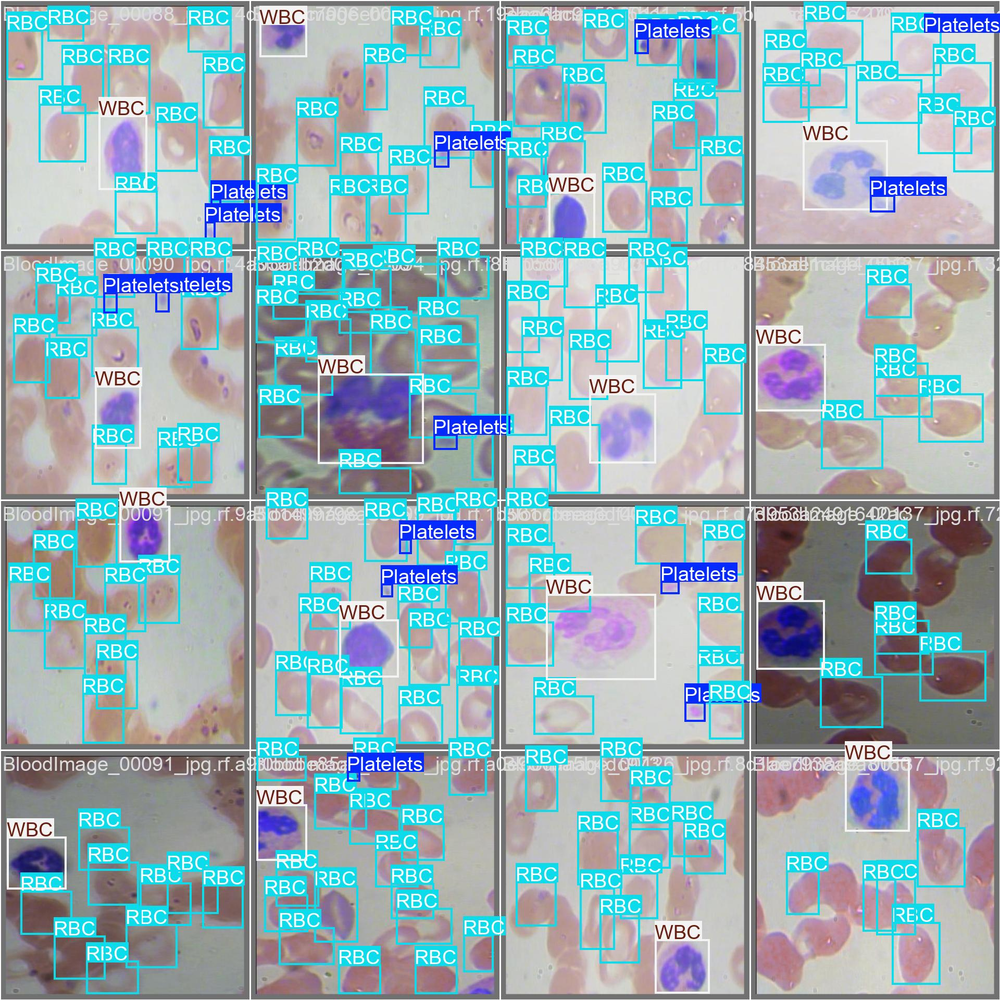

In [ ]:
Image(filename=f'{detection_train_save_dir}/val_batch1_labels.jpg',width=800)

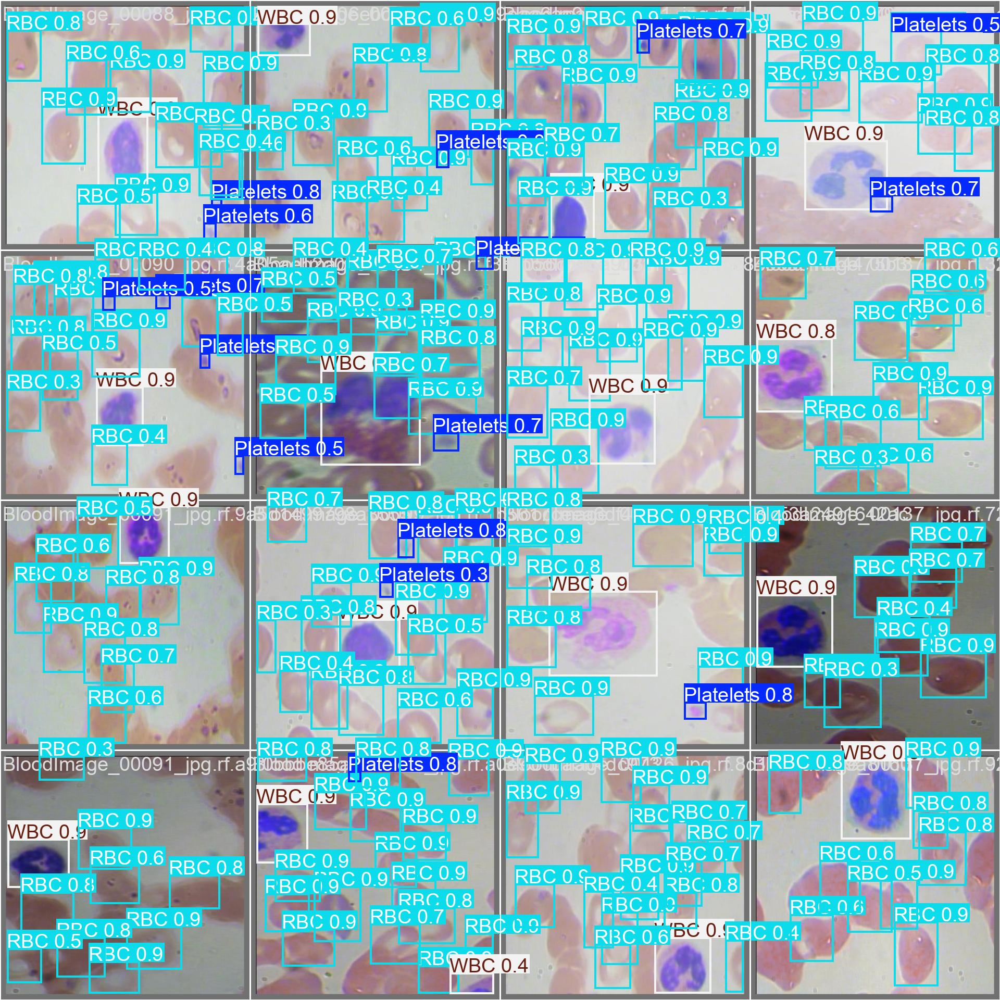

In [ ]:
Image(filename=f'{detection_train_save_dir}/val_batch1_pred.jpg',width=800)

## 5. [Validating (ULTRALYTICS YOLOV8)](https://docs.ultralytics.com/modes/val/#key-features-of-val-mode)

For a complete performance evaluation, it's crucial to review all these metrics. For more details, refer to the [Key Features of Val Mode](https://docs.ultralytics.com/modes/val/#key-features-of-val-mode).

In [ ]:
# Assume detection_val (metrics) is the object containing the validation results

# Validate the model. detection_val == metrics
detection_val = model.val()  # no arguments needed, dataset and settings remembered

Ultralytics YOLOv8.2.100 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/datasets/YOLO-1/val/labels.cache... 175 images, 0 backgrounds, 0 corrupt: 100%|██████████| 175/175 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.63it/s]


                   all        175       2301      0.889      0.943      0.953      0.707
             Platelets         94        173      0.858       0.96      0.957      0.544
                   RBC        164       1947      0.827       0.87      0.907      0.695
                   WBC        174        181      0.982          1      0.995      0.883
Speed: 0.8ms preprocess, 6.4ms inference, 0.1ms loss, 5.8ms postprocess per image
Results saved to runs/detect/train2


---
**Validation output console**

---

The output you've provided offers a summary of your YOLOv8 model's performance during validation. Here's an explanation in English:

1. **`Model Summary (fused)`:**
   - **Layers:** The model consists of 168 layers.
   - **Parameters:** It has 3,006,233 parameters, which are the weights learned during training.
   - **Gradients:** The model has 0 gradients, indicating that it's in evaluation mode (not training).
   - **GFLOPs:** The model has 8.1 GFLOPs, which measures the computational complexity (Giga Floating Point Operations per Second).

2. **`Validation Process`:**
   - The validation dataset consists of 175 images, all of which were processed without any errors or corrupted files.
   - There is a warning related to the use of `os.fork()` in a multithreaded context, which might cause a deadlock due to compatibility issues with JAX.

3. **`Performance Metrics`:**
   - **Class "all":** These metrics represent the overall performance across all classes.
     - **Images:** 175 images were used for validation.
     - **Instances:** 2301 instances (objects) were detected.
     - **Box(P):** Precision is 0.92, indicating how many of the detected objects were correctly identified.
     - **R (Recall):** Recall is 0.909, indicating the model's ability to detect all relevant objects.
     - **mAP50:** Mean Average Precision at IoU 0.5 is 0.951, showing high accuracy in object localization.
     - **mAP50-95:** Mean Average Precision across IoU thresholds from 0.5 to 0.95 is 0.705, representing overall model performance across various IoU thresholds.

4. **`Class-Specific Metrics`:**
   - **Platelets:**
     - Precision: 0.912, Recall: 0.908, mAP50: 0.955, mAP50-95: 0.545
   - **RBC (Red Blood Cells):**
     - Precision: 0.857, Recall: 0.82, mAP50: 0.904, mAP50-95: 0.692
   - **WBC (White Blood Cells):**
     - Precision: 0.989, Recall: 0.999, mAP50: 0.995, mAP50-95: 0.877

5. **`Efficiency`:**
   - **Speed:** The model takes 0.8ms for preprocessing, 8.7ms for inference, and 6.2ms for postprocessing per image. These times indicate how quickly the model processes each image during validation.

6. **`Results`:**
   - The results were saved to the directory `runs/detect/train32`.

In summary, the model shows strong performance across all classes, with particularly high precision and recall for White Blood Cells (WBC). The speed metrics suggest that the model is efficient, though there is a warning regarding a potential compatibility issue with `os.fork()` in a multithreaded environment.

---
**Visualize with pandas y seaborn**

---

To visualize the extracted metrics from `detection_val`, you can enhance it by ensuring the correct structure of the data and then using `pandas` and `seaborn` to visualize the results:

1. **`Extract and Organize Metrics`:** Ensure the extracted metrics are correctly processed and stored in a DataFrame.
   - **`General Metrics`:** Metrics like `map50-95`, `map50`, and `map75` are stored in `df_general`.
   - **`Category Metrics`:** mAP values for each category are stored in `df_categories`.

2. **`Visualize Metrics`:** Use `seaborn` to create plots for better insights into the metrics.
   - **`General Metrics Plot`:** A bar plot showing the values of `map50-95`, `map50`, and `map75`.
   - **`Category Metrics Plot`:** A bar plot of `mAP50-95` values for each category. The `melt` function is used to reshape the DataFrame for easier plotting.



General Metrics:
     Metric     Value
0  map50-95  0.707255
1     map50  0.952954
2     map75  0.806924

Category Metrics:
   Platelets       RBC       WBC
0   0.543875  0.695312  0.882578


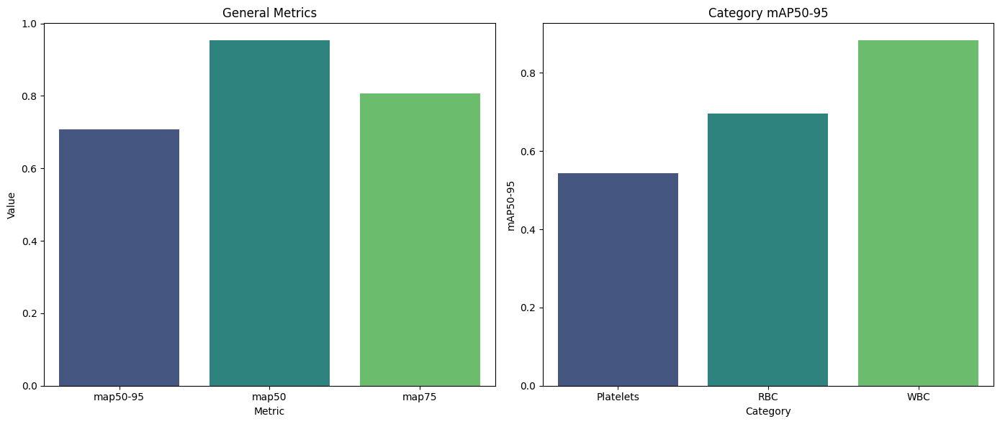

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Extract the relevant metrics from detection_val
map50_95 = detection_val.box.map  # map50-95
map50 = detection_val.box.map50  # map50
map75 = detection_val.box.map75  # map75
maps = detection_val.box.maps  # a list containing map50-95 for each category

# Create a dictionary with the extracted metrics
data = {
    'Metric': ['map50-95', 'map50', 'map75'],
    'Value': [map50_95, map50, map75]
}

# Create a DataFrame for general metrics
df_general = pd.DataFrame(data)

# If you have category names and mAPs for each category, include them
category_names = ['Platelets', 'RBC', 'WBC']  # Replace with actual category names
category_data = {name: [value] for name, value in zip(category_names, maps)}

# Create a DataFrame for category metrics
df_categories = pd.DataFrame(category_data)

# Print the DataFrames
print("General Metrics:")
print(df_general)
print("\nCategory Metrics:")
print(df_categories)

# Visualization
plt.figure(figsize=(14, 6))

# Plot general metrics
plt.subplot(1, 2, 1)
sns.barplot(data=df_general, x='Metric', y='Value', palette='viridis')
plt.title('General Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')

# Plot category metrics
plt.subplot(1, 2, 2)
df_categories_melted = df_categories.melt(var_name='Category', value_name='mAP')
sns.barplot(data=df_categories_melted, x='Category', y='mAP', palette='viridis')
plt.title('Category mAP50-95')
plt.xlabel('Category')
plt.ylabel('mAP50-95')

plt.tight_layout()
plt.show()



Here's an interpretation of each chart:

### Left Chart: General Metrics
- **`Metrics`**:
  - **`mAP50-95`**: This metric represents the mean Average Precision across multiple Intersection over Union (IoU) thresholds ranging from 50% to 95%. It provides a comprehensive view of the model's precision and recall performance over a range of IoU thresholds.
    - The value appears to be around 0.65, indicating that the model has moderate overall performance when considering stricter IoU thresholds.
  
  - **`mAP50`**: This is the mean Average Precision at an IoU threshold of 50%. It is generally easier to achieve a high score here compared to mAP50-95, as the threshold for correct detection is lower.
    - The value is higher, around 0.85, suggesting that the model performs well at this less stringent threshold.
  
  - **`mAP75`**: This metric represents the mean Average Precision at an IoU threshold of 75%. This threshold is more challenging than mAP50 but less strict than the upper bounds of mAP50-95.
    - The value is slightly lower than mAP50, at around 0.75, indicating the model's performance decreases as the IoU threshold becomes stricter but still remains strong.



### Right Chart: Category mAP50-95
- **`Categories`**:
  - **`Platelets`**: The mAP50-95 for the "Platelets" category is the lowest among the three, around 0.55. This suggests that the model has more difficulty accurately detecting or classifying platelet-related features.
  
  - **`RBC (Red Blood Cells)`**: The mAP50-95 for the RBC category is higher, around 0.70. The model performs better in detecting or classifying RBCs compared to platelets.
  
  - **`WBC (White Blood Cells)`**: The mAP50-95 for the WBC category is the highest, around 0.80. This indicates that the model is most effective in detecting or classifying white blood cells among the three categories.



### General Interpretation
- **`Performance Variation Across Metrics`**: The model performs better at lower IoU thresholds (mAP50) and its performance decreases as the threshold becomes stricter (mAP75, mAP50-95).
- **`Performance Across Categories`**: The model shows variability in performance across different categories. It is most effective at detecting/classifying WBCs, followed by RBCs, and it struggles the most with platelets.

This analysis suggests that while the model is generally effective, particularly with WBCs, there may be room for improvement in detecting or classifying platelets and performing well across stricter IoU thresholds.

---
**Print validation results**

---

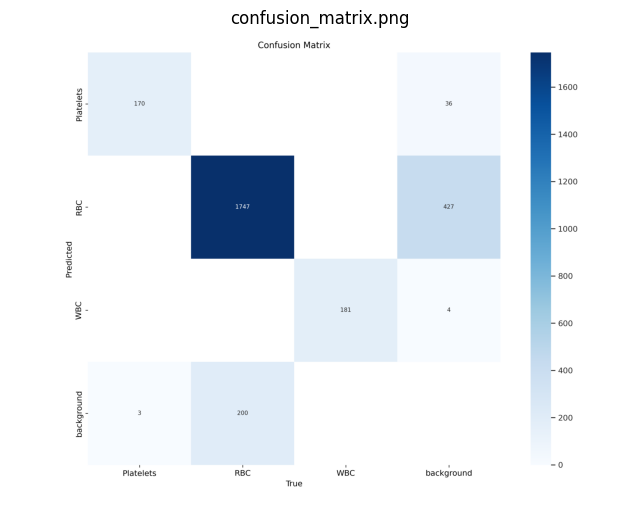

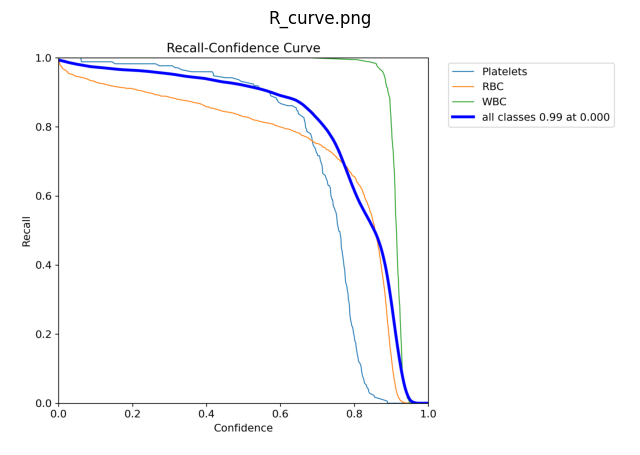

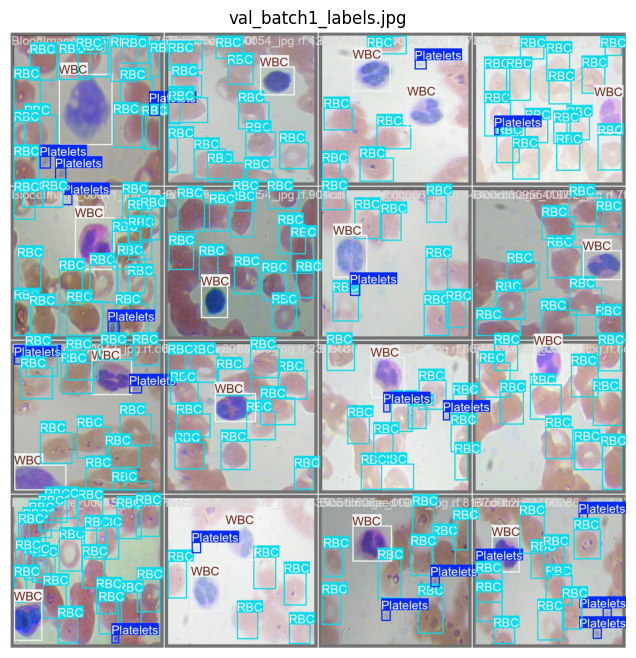

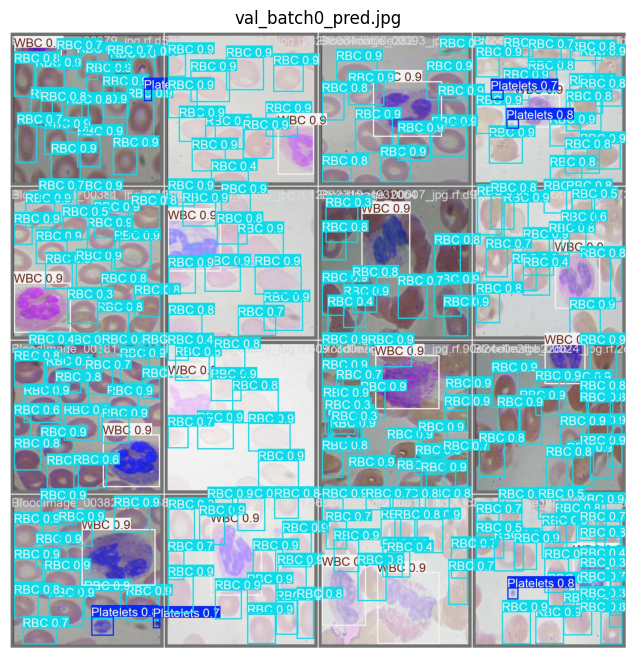

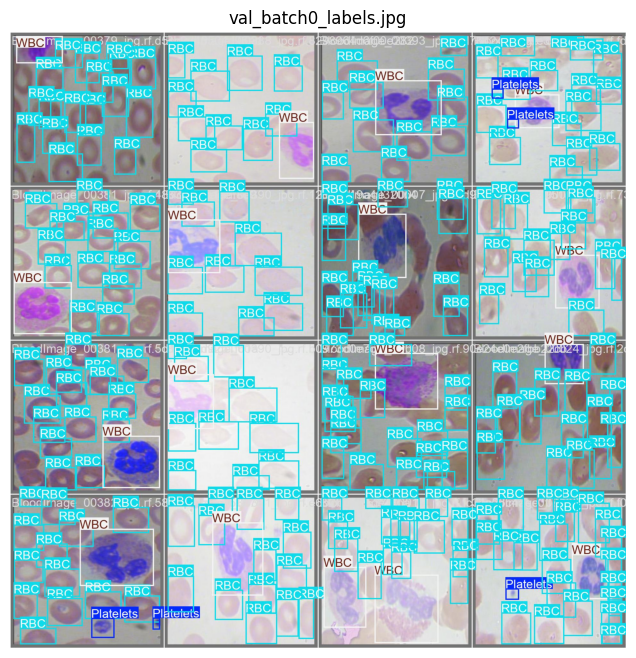

...

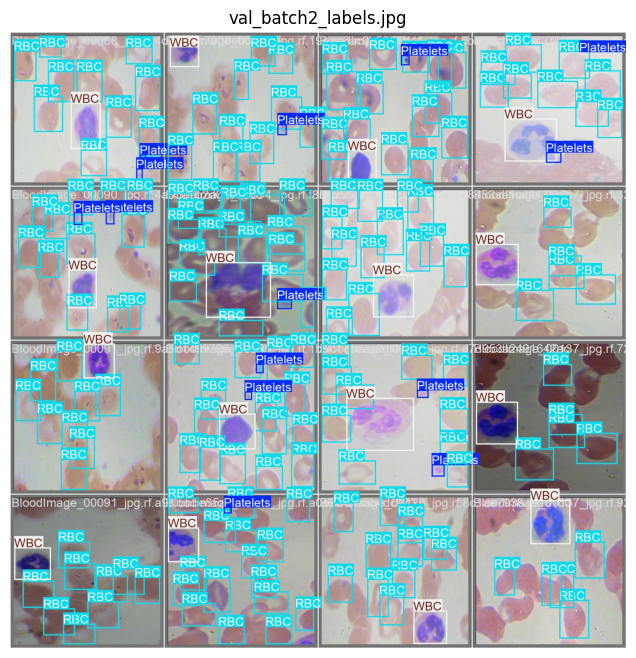

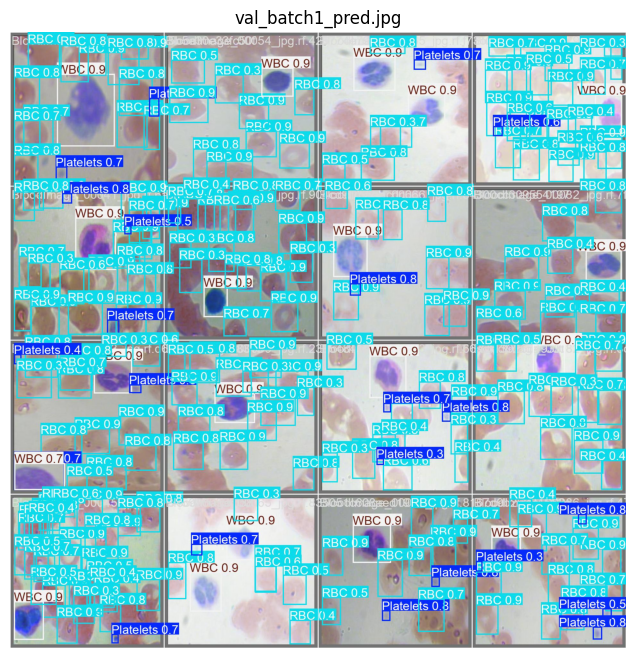

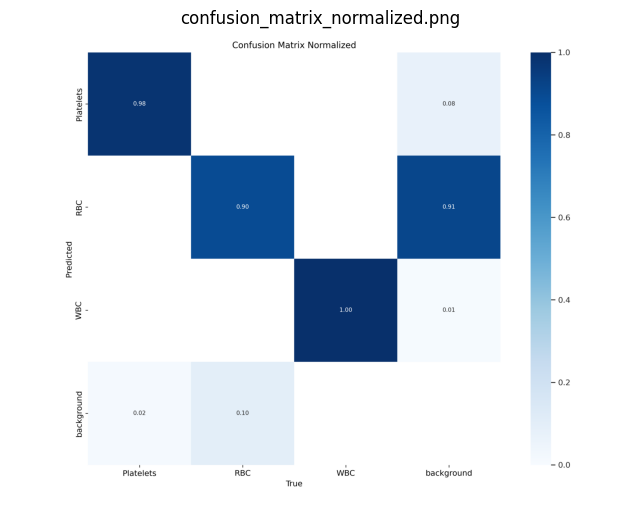

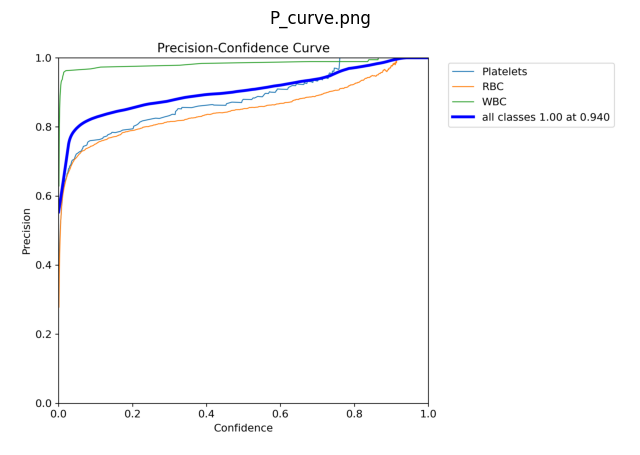

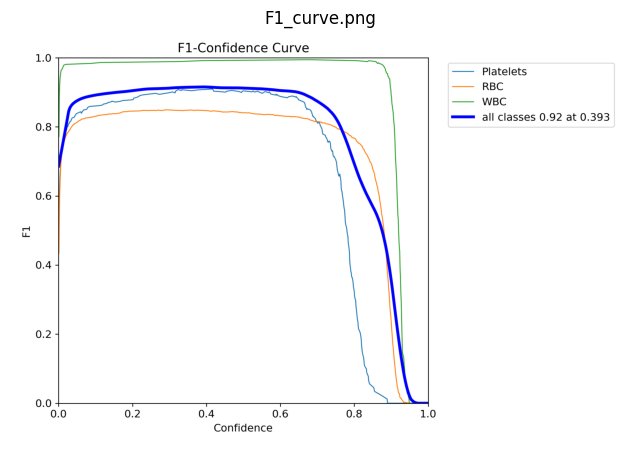

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Path to the directory containing the images
directory = detection_val.save_dir

# List all JPG and PNG files in the directory
image_files = [file for file in os.listdir(directory) if file.endswith(('.jpg', '.png'))]

# Check if there are any image files
if not image_files:
    print("No JPG or PNG files found in the directory.")
else:
    # Plot each image separately
    for file in image_files:
        # Open the image file
        img_path = os.path.join(directory, file)
        img = Image.open(img_path)

        # Display the image
        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        plt.title(file)
        plt.axis('off')
        plt.show()


## 6. Inference ([Prediction](https://docs.ultralytics.com/modes/predict/))

The process of making sense out of visual data is called 'inference' or 'prediction'. Ultralytics YOLOv8 offers a powerful feature known as predict mode that is tailored for high-performance, real-time inference on a wide range of data sources.

---
**Inference**

---

In [ ]:
# Run batched inference on a list of images
results = model(["/content/datasets/YOLO-1/test/images/BloodImage_00000_jpg.rf.5fb00ac1228969a39cee7cd6678ee704.jpg", "/content/datasets/YOLO-1/test/images/BloodImage_00023_jpg.rf.0438812a636b3cbe583ddb254ef6f844.jpg"])  # return a list of Results objects



0: 640x640 27 RBCs, 1 WBC, 22.5ms
1: 640x640 1 Platelets, 22 RBCs, 1 WBC, 22.5ms
Speed: 5.7ms preprocess, 22.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


---
**Inference over test dataset**

---

In [ ]:
# Define the directory path
directory_path = '/content/datasets/YOLO-1/test/images/'

# List all files in the directory with .jpg extension
# jpg_files = [f for f in os.listdir(directory_path) if f.endswith('.jpg')]

jpg_files = []

for root, dirs, files in os.walk(directory_path):
    for file in files:
        if file.endswith('.jpg'):
            jpg_files.append(os.path.join(root, file))# Define the directory path

results = model(jpg_files, save=True)  # return a list of Results objects



0: 640x640 20 RBCs, 1 WBC, 4.0ms
1: 640x640 1 Platelets, 19 RBCs, 2 WBCs, 4.0ms
2: 640x640 9 RBCs, 2 WBCs, 4.0ms
3: 640x640 13 RBCs, 1 WBC, 4.0ms
4: 640x640 16 RBCs, 1 WBC, 4.0ms
5: 640x640 1 Platelets, 18 RBCs, 1 WBC, 4.0ms
6: 640x640 1 Platelets, 13 RBCs, 1 WBC, 4.0ms
7: 640x640 13 RBCs, 1 WBC, 4.0ms
8: 640x640 1 Platelets, 13 RBCs, 1 WBC, 4.0ms
9: 640x640 2 Plateletss, 16 RBCs, 1 WBC, 4.0ms
10: 640x640 1 Platelets, 17 RBCs, 1 WBC, 4.0ms
11: 640x640 16 RBCs, 1 WBC, 4.0ms
12: 640x640 2 Plateletss, 18 RBCs, 1 WBC, 4.0ms
13: 640x640 1 Platelets, 19 RBCs, 1 WBC, 4.0ms
14: 640x640 13 RBCs, 1 WBC, 4.0ms
15: 640x640 18 RBCs, 4.0ms
16: 640x640 15 RBCs, 1 WBC, 4.0ms
17: 640x640 1 Platelets, 17 RBCs, 1 WBC, 4.0ms
18: 640x640 2 Plateletss, 17 RBCs, 1 WBC, 4.0ms
19: 640x640 1 Platelets, 16 RBCs, 1 WBC, 4.0ms
20: 640x640 1 Platelets, 19 RBCs, 1 WBC, 4.0ms
21: 640x640 1 Platelets, 10 RBCs, 1 WBC, 4.0ms
22: 640x640 15 RBCs, 1 WBC, 4.0ms
23: 640x640 16 RBCs, 1 WBC, 4.0ms
24: 640x640 1 Platelets, 18

---
**Display Results of prediction over test dataset**

---

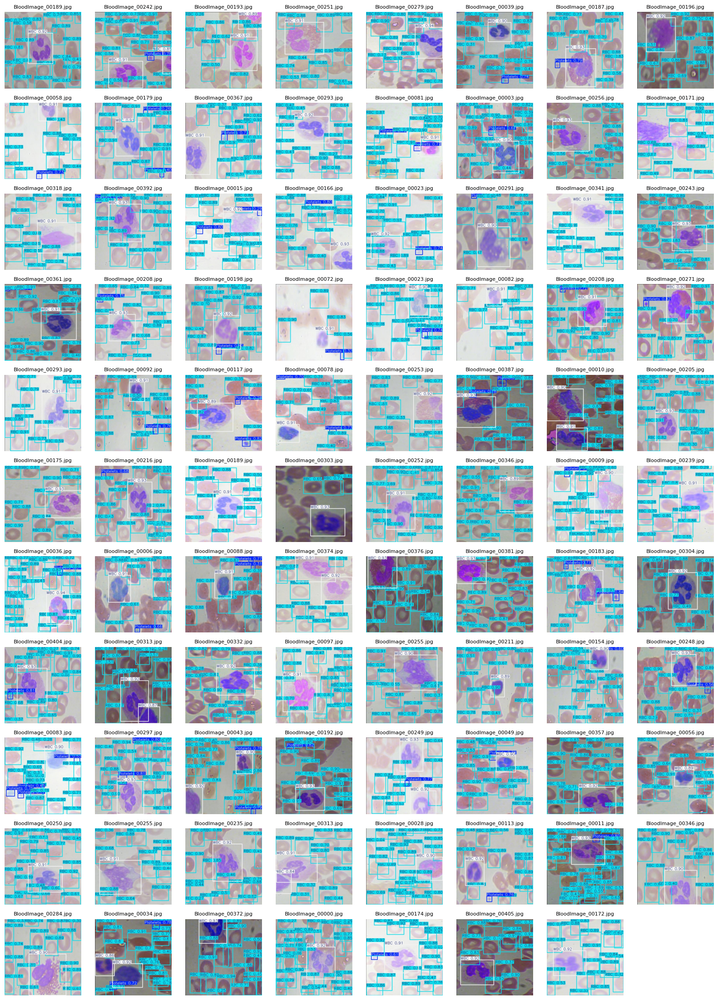

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# Define the number of columns you want in the grid
ncols = 8  # Change this value according to your needs
nrows = (len(results) + ncols - 1) // ncols  # Calculate the number of rows required

# Create a figure with an appropriate size
plt.figure(figsize=(ncols * 2, nrows * 2))

# Process the list of results
for i, result in enumerate(results):
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    result.save(filename=f"results{i}.jpg")  # save to disk
    img = Image.open(f"results{i}.jpg")

    filename = os.path.basename(result.path)  # Extrae solo el nombre del archivo
    filename_short = filename.split('_jpg')[0] + '.jpg'

    # Add the image to the grid
    plt.subplot(nrows, ncols, i + 1)  # Position the image on the grid
    plt.imshow(img)
    plt.title(f"{filename_short}", fontsize=8)  # You can change this according to your needs
    plt.axis('off')

# Show the complete grid
plt.tight_layout()
plt.show()


---
**Display 9 random images from test**

---

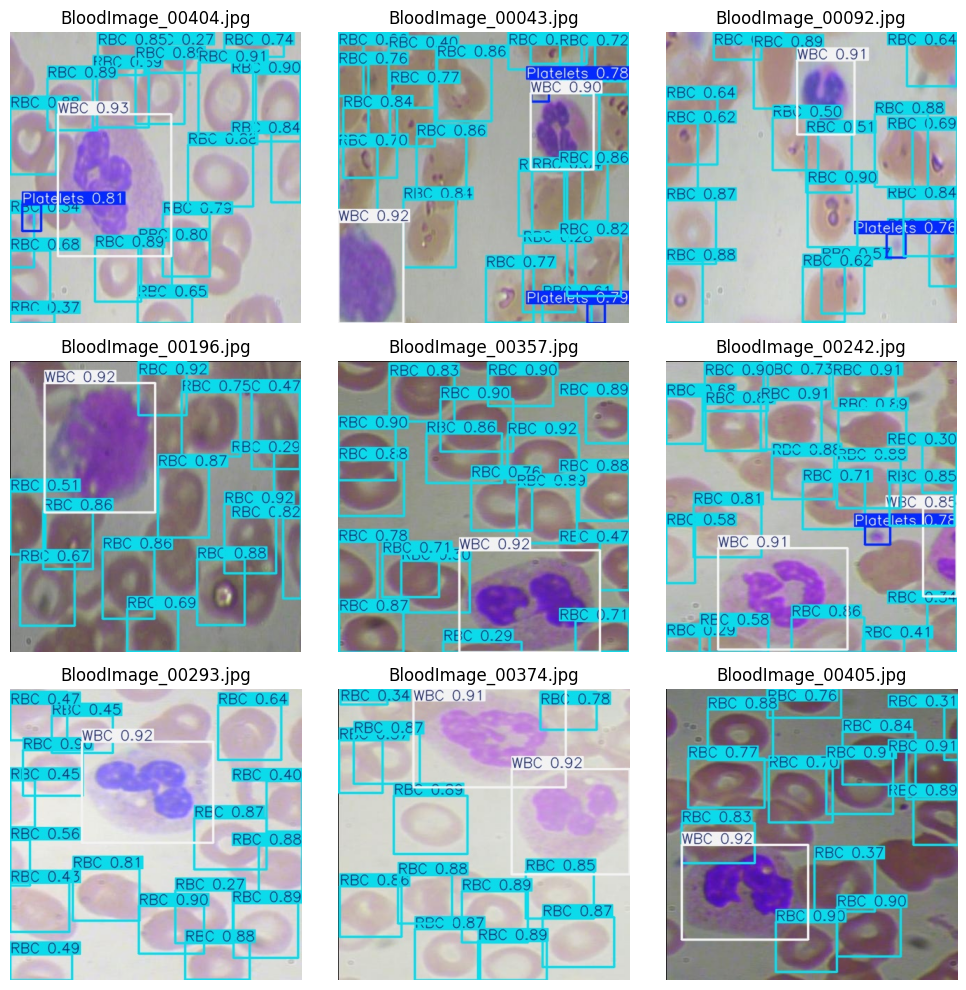

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import random

# Define the base directory path
base_dir = results[0].save_dir

# Get all image file paths
image_files = [f for f in os.listdir(base_dir) if f.endswith('.jpg')]

# Select 9 random images
selected_images = random.sample(image_files, 9)

# Create a 3x3 subplot figure
fig, axes = plt.subplots(3, 3, figsize=(10, 10))

# Display the selected images
for i, image_file in enumerate(selected_images):
    image_path = os.path.join(base_dir, image_file)
    image = Image.open(image_path)
    row = i // 3
    col = i % 3
    axes[row, col].imshow(image)
    axes[row, col].axis('off')  # Turn off axis labels
    filename = os.path.basename(image_path)  # Extract only the filename
    filename_short = filename.split('_jpg')[0] + '.jpg'
    axes[row, col].set_title(filename_short)  # Set title as file name

plt.tight_layout()
plt.show()

## `NOTEBOOK PRACTICE 14`

---
Modify the baseline notebook to get better performance.

---

### Instructions to Improve the Notebook (study and work about it by yourself):

ChatGPT can be your great allied. Use it for your convenence.

You can use a model different from nano. You can use other biomedical multiclass (3 o 4 classes) dataset which allows detection (you need some type of annotation). you can use a diferent number of epochs. You can use some different [augmentations](https://docs.ultralytics.com/es/modes/train/#augmentation-settings-and-hyperparameters).

Feel free to modify and adapt the exercise as needed to suit your learning objectives and preferences.

Happy coding!